# scMixology Scanpy Workflow - V8


## Import and Setups


In [1]:
import os
import re
import json
import time
import platform
from datetime import datetime
from pathlib import Path

import scanpy as sc
import pandas as pd
import numpy as np
import anndata as ad
import matplotlib.pyplot as plt
import sklearn
import louvain
import scrublet as scr
from pyclustree import clustree
from sklearn.metrics import adjusted_rand_score

BASE_DIR = "/home/mtarzi/CEPH/scRNA_sequencing_scMixology_benchmarking"
DATASET = "scMixology"
VERSION = "V8"

MIN_GENES_PER_CELL = 200
MIN_CELLS_PER_GENE = 3
MAX_GENES_PER_CELL = 5000
MAX_MITO_PERCENT = 5

TARGET_SUM = 1e4
N_HVGS = 2000
N_PCS = 50
N_NEIGHBORS = 10
SELECTED_PCS = 50
TSNE_N_PCS = 50
TSNE_PERPLEXITY = 30

FINAL_SELECTED_RESOLUTION = 0.2
FINAL_METHOD = "louvain"
FINAL_RES_KEY = str(FINAL_SELECTED_RESOLUTION).replace(".", "")
FINAL_CLUSTER_KEY = f"{FINAL_METHOD}_res{FINAL_RES_KEY}"

CELLRANGER_OUTS = os.path.join(BASE_DIR, "cell_ranger", "SCMIXOLOGY", "outs")
MATRIX_DIR = os.path.join(CELLRANGER_OUTS, "filtered_feature_bc_matrix")

OUT_DIR = os.path.join(BASE_DIR, "scanpy_outputs")
TABLE_DIR = os.path.join(OUT_DIR, "tables")
FIGURE_DIR = os.path.join(OUT_DIR, "figures")
OBJECT_DIR = os.path.join(OUT_DIR, "objects")

os.makedirs(TABLE_DIR, exist_ok=True)
os.makedirs(FIGURE_DIR, exist_ok=True)
os.makedirs(OBJECT_DIR, exist_ok=True)

sc.settings.figdir = FIGURE_DIR
sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=100, facecolor="white")


/home/mtarzi/.conda/envs/scRNA-python/lib/python3.11/site-packages/louvain/__init__.py:54: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import get_distribution, DistributionNotFound


## Time Tracking


In [2]:
workflow_start = time.time()

## Load pre-filter AnnData object


In [3]:
# Load the shared pre-filter object
PREFILTER_H5AD = os.path.join(
    OBJECT_DIR,
    "scMixology_scanpy_prefilter_with_metadata.h5ad"
)

if not os.path.exists(PREFILTER_H5AD):
    raise FileNotFoundError(
        f"Pre-filter object not found: {PREFILTER_H5AD}\n"
        "Run the original template once up to 'Save AnnData object before filtering' first."
    )

adata = sc.read_h5ad(PREFILTER_H5AD)

# Make sure expected metadata columns are available
if "sample" not in adata.obs.columns:
    adata.obs["sample"] = "SCMIXOLOGY"

if "known_label" not in adata.obs.columns:
    adata.obs["known_label"] = "unmatched"

adata.obs["known_label_plot"] = (
    adata.obs["known_label"]
    .astype("object")
    .where(adata.obs["known_label"].notna(), "unmatched")
    .astype(str)
)

# Make sure expected gene metadata columns are available
adata.var["mt"] = adata.var_names.str.upper().str.startswith("MT-")
adata.var["rps"] = adata.var_names.str.upper().str.startswith("RPS")
adata.var["rpl"] = adata.var_names.str.upper().str.startswith("RPL")

print("Loaded pre-filter AnnData:")
print(adata)
print("\nKnown label counts:")
print(adata.obs["known_label_plot"].value_counts(dropna=False))


Loaded pre-filter AnnData:
AnnData object with n_obs × n_vars = 4488 × 38606
    obs: 'sample', 'known_label', 'barcode_cellranger', 'barcode_clean', 'barcode_16bp', 'known_label_plot', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rps', 'pct_counts_rps', 'total_counts_rpl', 'pct_counts_rpl'
    var: 'gene_ids', 'feature_types', 'mt', 'rps', 'rpl', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

Known label counts:
known_label_plot
A549         1256
H838          876
H2228         757
HCC827        587
unmatched     572
H1975         440
Name: count, dtype: int64


## QC Metrics and Plots


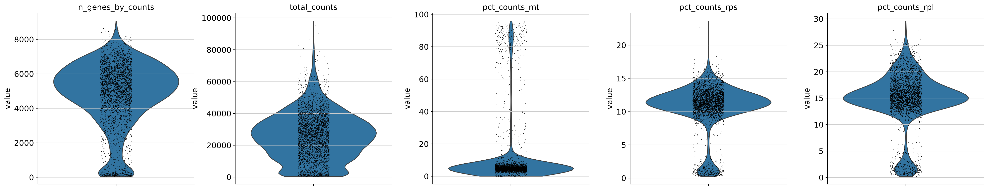

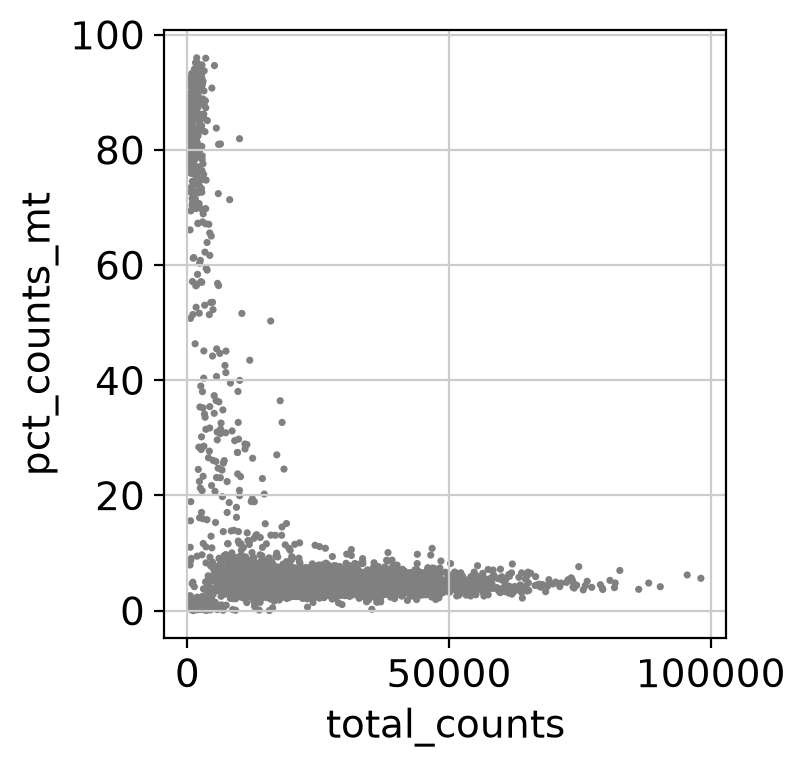

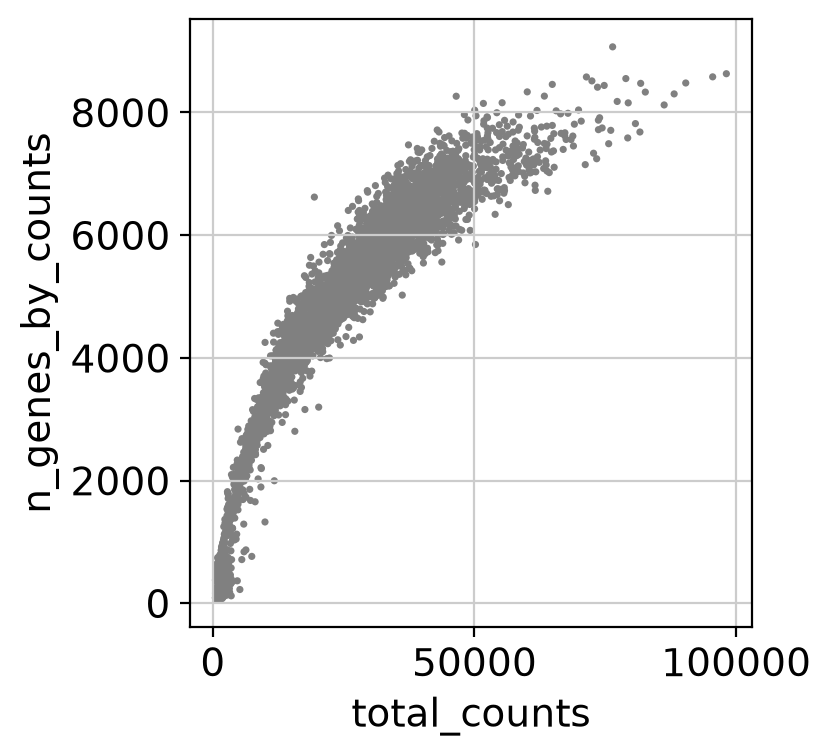

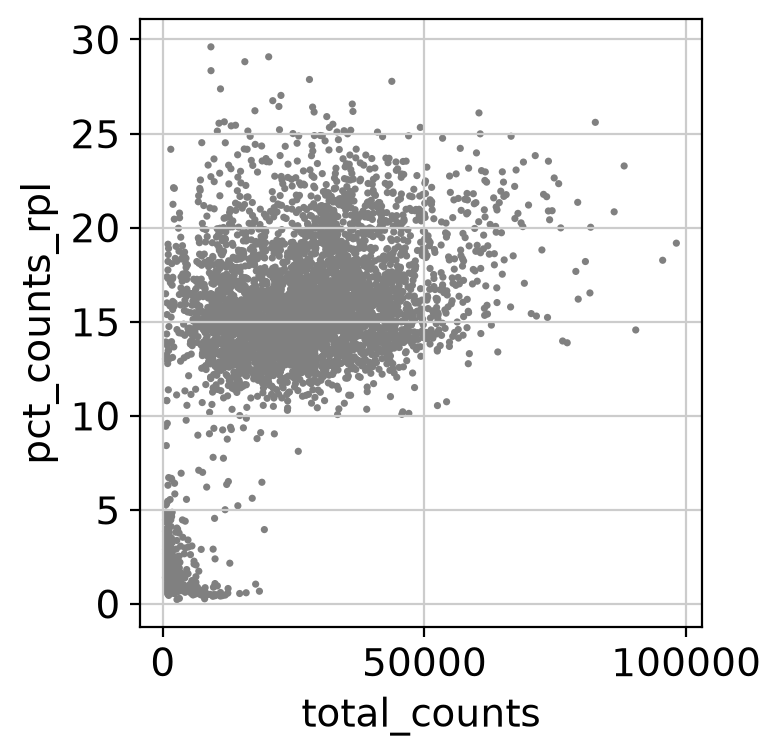

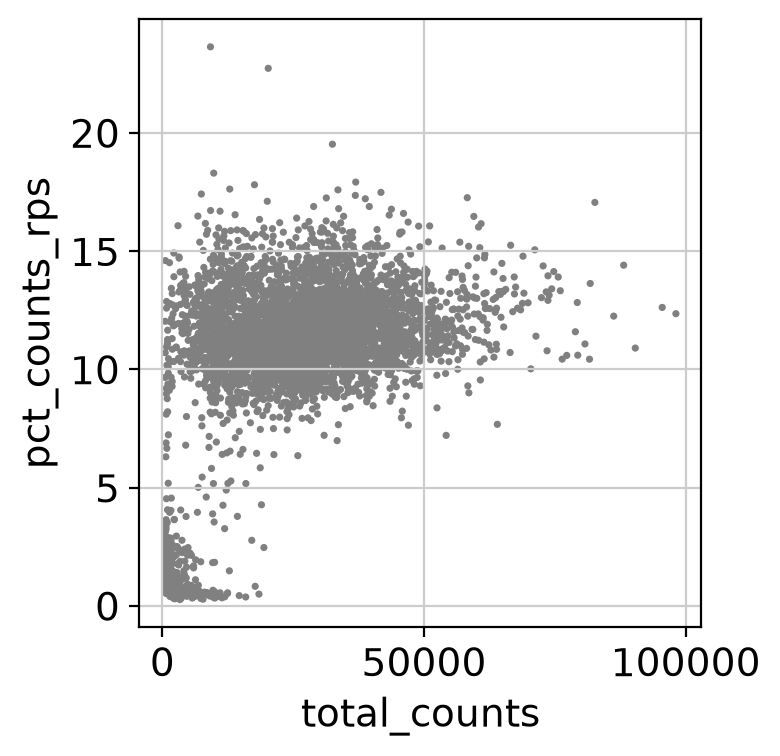

In [4]:
sc.pp.calculate_qc_metrics(
    adata,
    qc_vars=["mt","rps","rpl"],
    percent_top=None,
    log1p=False,
    inplace=True
)

qc_before = adata.obs[
    ["n_genes_by_counts", "total_counts", "pct_counts_mt", "pct_counts_rps", "pct_counts_rpl"]
].describe()

qc_before.to_csv(
    os.path.join(TABLE_DIR, "scMixology_scanpy_qc_summary_before_filtering.csv")
)

qc_before

sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt", "pct_counts_rps", "pct_counts_rpl"],
    multi_panel=True,
    save="_scMixology_scanpy_qc_before_filtering.png"
)


sc.pl.scatter(
    adata,
    x="total_counts",
    y="pct_counts_mt",
    save="_scMixology_scanpy_counts_vs_mt.png"
)

sc.pl.scatter(
    adata,
    x="total_counts",
    y="n_genes_by_counts",
    save="_scMixology_scanpy_counts_vs_genes.png"
)

sc.pl.scatter(
    adata,
    x="total_counts",
    y="pct_counts_rpl",
    save="_scMixology_scanpy_counts_vs_rpl"
)

sc.pl.scatter(
    adata,
    x="total_counts",
    y="pct_counts_rps",
    save="_scMixology_scanpy_counts_vs_rps"
)

## Filtering


In [5]:
# Before filtering
initial_cells = adata.n_obs
initial_genes = adata.n_vars

print(f"Number of cells before filtering: {initial_cells}")
print(f"Number of genes before filtering: {initial_genes}")


# Basic filtering
sc.pp.filter_cells(adata, min_genes= MIN_GENES_PER_CELL)
sc.pp.filter_genes(adata, min_cells= MIN_CELLS_PER_GENE)


# Extra QC filtering
adata = adata[
    (adata.obs["n_genes_by_counts"] < MAX_GENES_PER_CELL) &
    (adata.obs["pct_counts_mt"] < MAX_MITO_PERCENT),
    :
].copy()


# After filtering
filtered_cells = adata.n_obs
filtered_genes = adata.n_vars

print("After filtering:")
print(adata)

print(f"Number of cells after filtering: {filtered_cells}")
print(f"Number of genes after filtering: {filtered_genes}")


# Filter summary
filtering_summary = pd.DataFrame([{
    "initial_cells": initial_cells,
    "filtered_cells": filtered_cells,
    "removed_cells": initial_cells - filtered_cells,
    "initial_genes": initial_genes,
    "filtered_genes": filtered_genes,
    "removed_genes": initial_genes - filtered_genes,
    "min_genes_per_cell": MIN_GENES_PER_CELL,
    "min_cells_per_gene": MIN_CELLS_PER_GENE,
    "max_genes_per_cell": MAX_GENES_PER_CELL,
    "max_mito_percent": MAX_MITO_PERCENT
}])

#Save
filtering_summary.to_csv(
    os.path.join(TABLE_DIR, f"scMixology_scanpy_{VERSION}_filtering_summary.csv"),
    index=False
)


Number of cells before filtering: 4488
Number of genes before filtering: 38606
filtered out 170 cells that have less than 200 genes expressed
filtered out 12322 genes that are detected in less than 3 cells
After filtering:
AnnData object with n_obs × n_vars = 780 × 26284
    obs: 'sample', 'known_label', 'barcode_cellranger', 'barcode_clean', 'barcode_16bp', 'known_label_plot', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rps', 'pct_counts_rps', 'total_counts_rpl', 'pct_counts_rpl', 'n_genes'
    var: 'gene_ids', 'feature_types', 'mt', 'rps', 'rpl', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
Number of cells after filtering: 780
Number of genes after filtering: 26284


In [6]:
filtering_summary

,initial_cells,filtered_cells,removed_cells,initial_genes,filtered_genes,removed_genes,min_genes_per_cell,min_cells_per_gene,max_genes_per_cell,max_mito_percent
0,4488,780,3708,38606,26284,12322,200,3,5000,5


## QC metrics and Plots after filtering


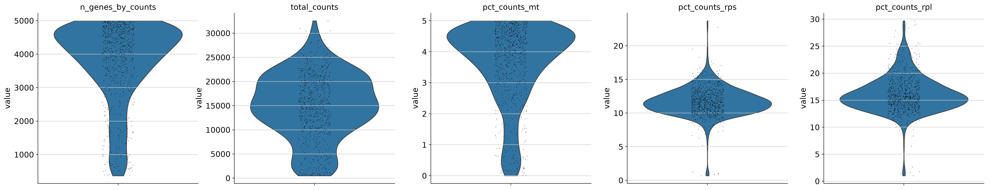

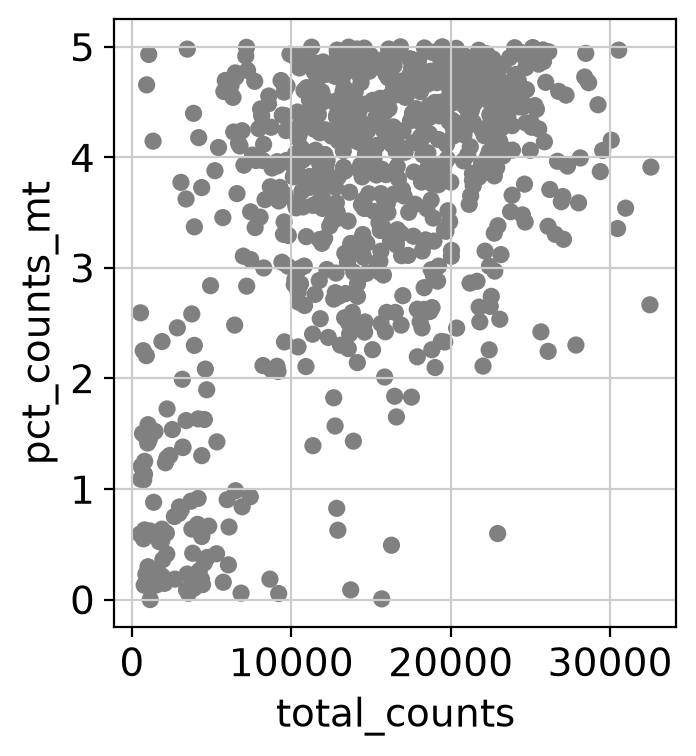

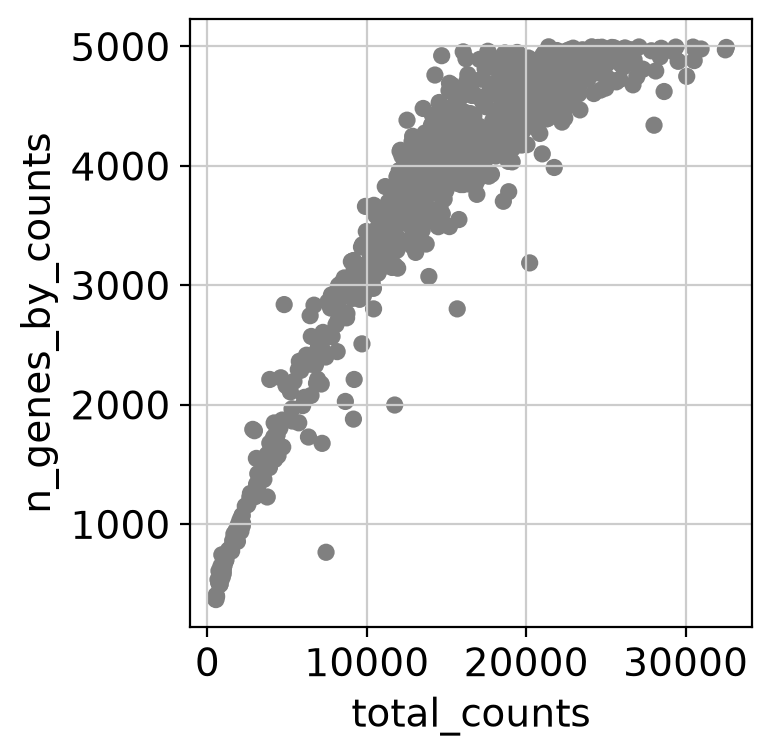

In [7]:
sc.pp.calculate_qc_metrics(
    adata,
    qc_vars=["mt", "rps", "rpl"],
    percent_top=None,
    log1p=False,
    inplace=True
)

qc_after = adata.obs[
    ["n_genes_by_counts", "total_counts", "pct_counts_mt", "pct_counts_rps", "pct_counts_rpl"]
].describe()

qc_after.to_csv(
    os.path.join(TABLE_DIR, f"scMixology_scanpy_{VERSION}_qc_summary_after_filtering.csv")
)

sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt", "pct_counts_rps", "pct_counts_rpl"],
    multi_panel=True,
    save=f"_scMixology_scanpy_{VERSION}_qc_after_filtering.png"
)

sc.pl.scatter(
    adata,
    x="total_counts",
    y="pct_counts_mt",
    save=f"_scMixology_scanpy_{VERSION}_counts_vs_mt_after_filtering.png"
)

sc.pl.scatter(
    adata,
    x="total_counts",
    y="n_genes_by_counts",
    save=f"_scMixology_scanpy_{VERSION}_counts_vs_genes_after_filtering.png"
)



## Remove Doublets


In [8]:
# Save counts before normalization
counts_matrix = adata.X.copy()

scrub = scr.Scrublet(counts_matrix)

doublet_scores, predicted_doublets = scrub.scrub_doublets()

adata.obs["doublet_score"] = doublet_scores
adata.obs["predicted_doublet"] = predicted_doublets

adata.obs["predicted_doublet"].value_counts()

# save doublet summary
doublet_summary = pd.DataFrame({
    "category": ["singlet", "doublet"],
    "n_cells": [
        (~adata.obs["predicted_doublet"]).sum(),
        adata.obs["predicted_doublet"].sum()
    ]
})

doublet_summary.to_csv(
    os.path.join(TABLE_DIR, f"scMixology_scanpy_{VERSION}_doublet_summary.csv"),
    index=False
)

print("Before doublet removal:", adata.shape)

# remove predicted doublets
adata = adata[~adata.obs["predicted_doublet"]].copy()

print("After doublet removal:", adata.shape)


doublet_summary


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.33
Detected doublet rate = 0.8%
Estimated detectable doublet fraction = 47.9%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 1.6%
Elapsed time: 1.0 seconds
Before doublet removal: (780, 26284)
After doublet removal: (774, 26284)


,category,n_cells
0,singlet,774
1,doublet,6


## Normalize and log-transform


In [9]:
sc.pp.normalize_total(adata, target_sum=TARGET_SUM)
sc.pp.log1p(adata)



normalizing counts per cell
    finished (0:00:00)


In [10]:
# save log-normalized matrix before HVG subsetting
adata.raw = adata.copy()

## High Variable Genes


extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


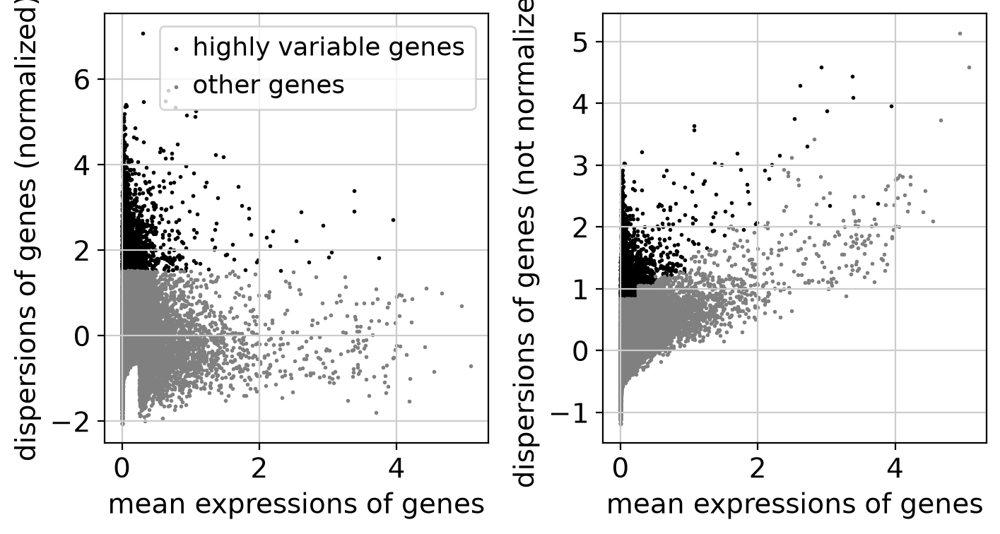

In [11]:
sc.pp.highly_variable_genes(
    adata,
    min_mean=0.0125,
    max_mean=3,
    min_disp=0.5,
    n_top_genes=N_HVGS
)

sc.pl.highly_variable_genes(adata, save=f"_scMixology_scanpy_{VERSION}_HVGs.png")


hvg_table = adata.var[adata.var["highly_variable"]].copy()
hvg_table.to_csv(
    os.path.join(TABLE_DIR, f"scMixology_scanpy_{VERSION}_highly_variable_genes.csv")
)

# to use HVGs for downstream analysis
adata = adata[:, adata.var["highly_variable"]].copy()

## Scale Data


In [12]:
# Scale
sc.pp.scale(adata, max_value=10)



/home/mtarzi/.conda/envs/scRNA-python/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


##  PCA


computing PCA
    with n_comps=50
    finished (0:00:00)


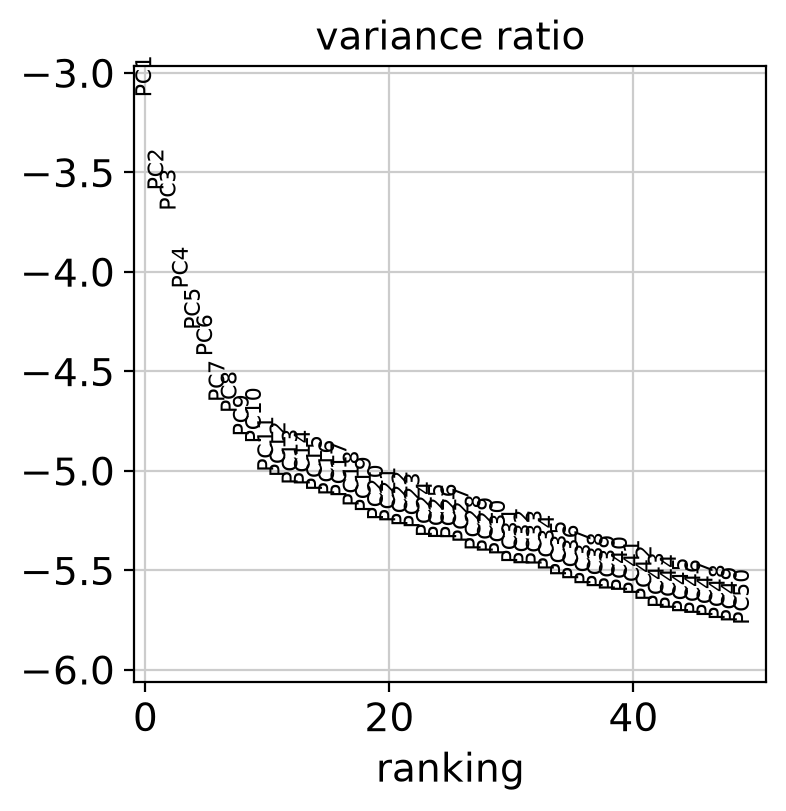

In [13]:
sc.tl.pca(adata, n_comps=N_PCS, svd_solver="arpack")

# Built-in Scanpy PCA variance-ratio plot
ax = sc.pl.pca_variance_ratio(
    adata,
    n_pcs=N_PCS,
    log=True,
    show=False
)


plt.savefig(
    os.path.join(FIGURE_DIR, f"scMixology_scanpy_{VERSION}_PCA_variance_ratio_log.png"),
    dpi=300,
    bbox_inches="tight"
)

plt.show()


## Calculate PC Range and Select PCs  manually


Criterion 1, co1: 50
Criterion 2, co2: 43
Recommended PC range: 43 to 50
Manually selected PCs: 50
SELECTED_PCS is inside the calculated PC range.


,version,N_PCS_calculated,SELECTED_PCS,TSNE_N_PCS,TSNE_PERPLEXITY,co1,co1_description,co2,co2_description,recommended_PC_range_min,recommended_PC_range_max
0,V8,50,50,50,30,50,First PC where cumulative variance > 90% and i...,43,Last PC where drop in explained variance betwe...,43,50


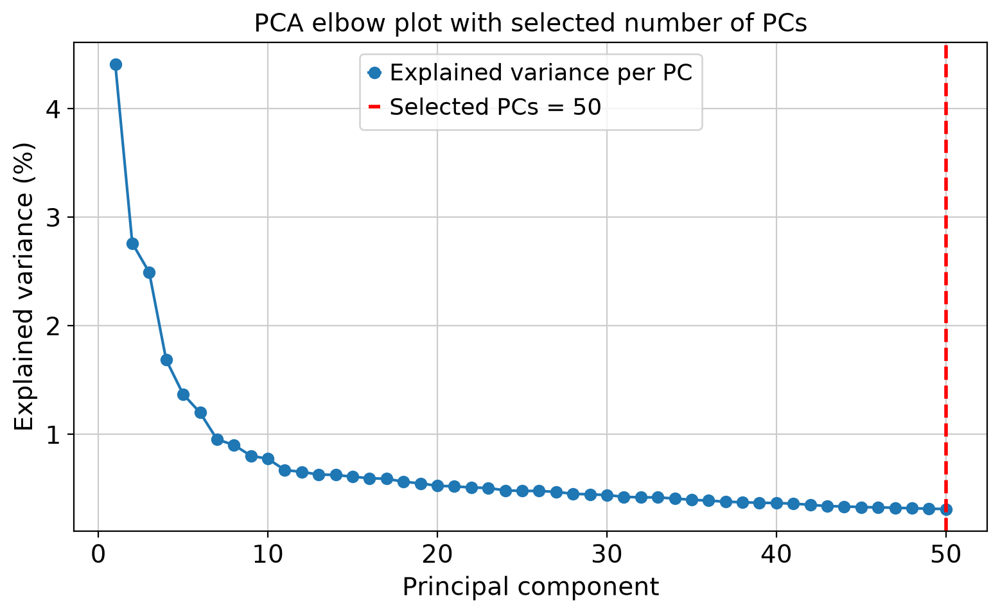

In [14]:
# Explained variance ratio in percent
pc_var_ratio = adata.uns["pca"]["variance_ratio"] * 100
pc_cumulative_variance = np.cumsum(pc_var_ratio)
pcs = np.arange(1, len(pc_var_ratio) + 1)

# Criterion 1:
# first PC where cumulative variance is greater than 90%
# and individual PC contribution is less than 5%
co1_candidates = np.where(
    (pc_cumulative_variance > 90) &
    (pc_var_ratio < 5)
)[0]

if len(co1_candidates) > 0:
    co1 = co1_candidates[0] + 1
else:
    co1 = len(pc_var_ratio)

# Criterion 2:
# last PC where the drop in explained variance between consecutive PCs is more than 0.01%
pc_variance_drop = pc_var_ratio[:-1] - pc_var_ratio[1:]

co2_candidates = np.where(pc_variance_drop > 0.01)[0]

if len(co2_candidates) > 0:
    co2 = co2_candidates[-1] + 2
else:
    co2 = len(pc_var_ratio)

PC_RANGE_MIN = min(co1, co2)
PC_RANGE_MAX = max(co1, co2)

print("Criterion 1, co1:", co1)
print("Criterion 2, co2:", co2)
print("Recommended PC range:", PC_RANGE_MIN, "to", PC_RANGE_MAX)
print("Manually selected PCs:", SELECTED_PCS)

if SELECTED_PCS < PC_RANGE_MIN or SELECTED_PCS > PC_RANGE_MAX:
    print(
        "Warning: SELECTED_PCS is outside the calculated PC range. "
        "This is acceptable if the choice is made for benchmark comparability or sensitivity testing."
    )
else:
    print("SELECTED_PCS is inside the calculated PC range.")

pc_range_summary = pd.DataFrame([{
    "version": VERSION,
    "N_PCS_calculated": N_PCS,
    "SELECTED_PCS": SELECTED_PCS,
    "TSNE_N_PCS": TSNE_N_PCS,
    "TSNE_PERPLEXITY": TSNE_PERPLEXITY,
    "co1": co1,
    "co1_description": "First PC where cumulative variance > 90% and individual variance < 5%",
    "co2": co2,
    "co2_description": "Last PC where drop in explained variance between consecutive PCs > 0.01%",
    "recommended_PC_range_min": PC_RANGE_MIN,
    "recommended_PC_range_max": PC_RANGE_MAX
}])

pc_range_summary.to_csv(
    os.path.join(TABLE_DIR, f"scMixology_scanpy_{VERSION}_PC_range_summary.csv"),
    index=False
)

display(pc_range_summary)

# Final elbow plot with selected PCs marked in red
plt.figure(figsize=(8, 5))

plt.plot(
    pcs,
    pc_var_ratio,
    marker="o",
    label="Explained variance per PC"
)

plt.axvline(
    x=SELECTED_PCS,
    color="red",
    linestyle="--",
    linewidth=2,
    label=f"Selected PCs = {SELECTED_PCS}"
)

plt.xlabel("Principal component")
plt.ylabel("Explained variance (%)")
plt.title("PCA elbow plot with selected number of PCs")
plt.legend()
plt.tight_layout()

plt.savefig(
    os.path.join(FIGURE_DIR, f"scMixology_scanpy_{VERSION}_PCA_elbow_variance_ratio_selected_PCs.png"),
    dpi=300
)

plt.show()


## Build neighborhood graph


In [15]:
if SELECTED_PCS > adata.obsm["X_pca"].shape[1]:
    raise ValueError(
        f"SELECTED_PCS={SELECTED_PCS} is larger than calculated PCs={adata.obsm['X_pca'].shape[1]}. "
        "Increase N_PCS or lower SELECTED_PCS."
    )

sc.pp.neighbors(
    adata,
    n_neighbors=N_NEIGHBORS,
    n_pcs=SELECTED_PCS
)


computing neighbors
    using 'X_pca' with n_pcs = 50


/home/mtarzi/.conda/envs/scRNA-python/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:08)


## UMAP & t-SNE


computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:01)


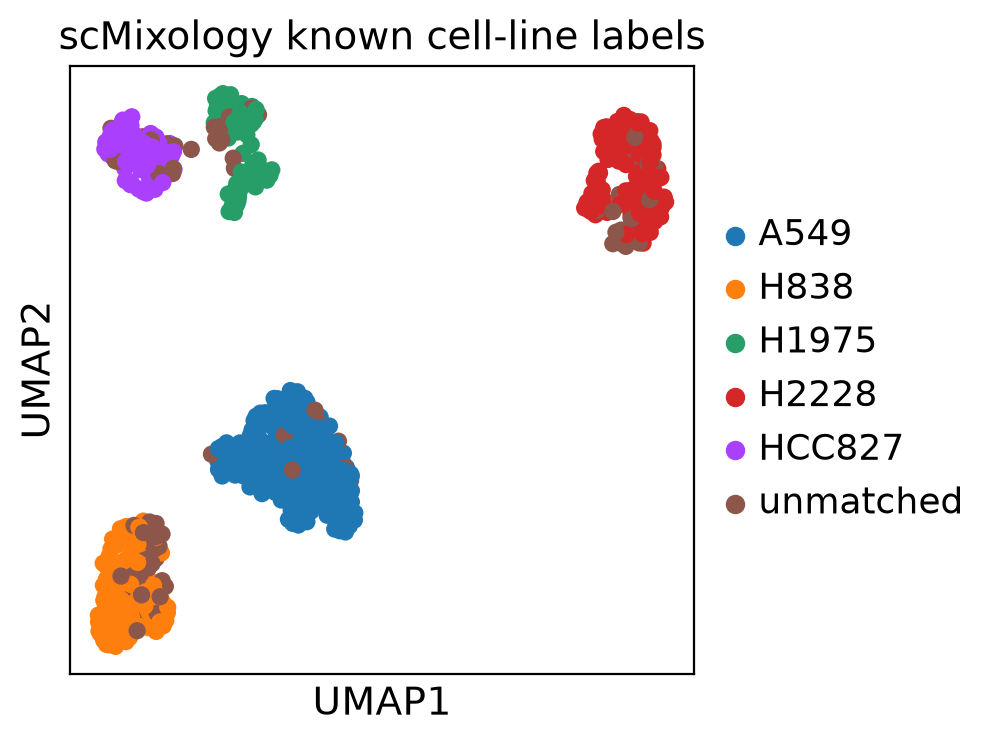

computing tSNE
    using 'X_pca' with n_pcs = 50
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm)
    'tsne', tSNE parameters (adata.uns) (0:00:01)


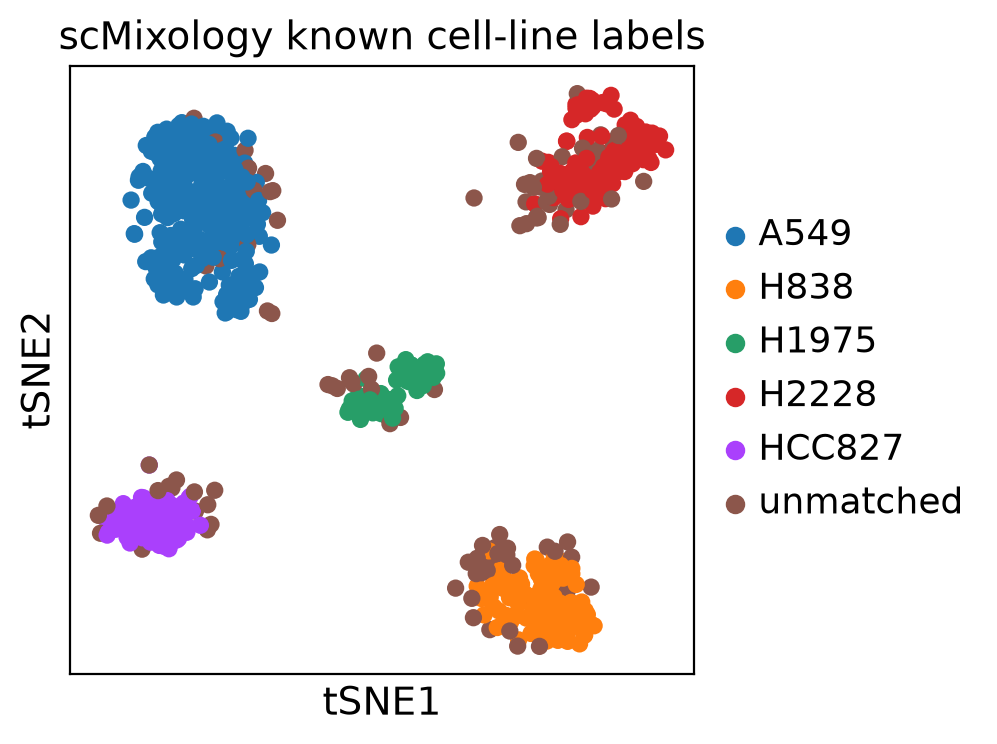

In [16]:
# UMAP
sc.tl.umap(adata)

sc.pl.umap(
    adata,
    color="known_label_plot",
    legend_loc="right margin",
    title="scMixology known cell-line labels",
    save=f"_scMixology_scanpy_{VERSION}_UMAP_known_labels.png"
)

# t-SNE
sc.tl.tsne(
    adata,
    n_pcs=TSNE_N_PCS,
    perplexity=TSNE_PERPLEXITY
)

sc.pl.tsne(
    adata,
    color="known_label_plot",
    legend_loc="right margin",
    title="scMixology known cell-line labels",
    save=f"_scMixology_scanpy_{VERSION}_tSNE_known_labels.png"
)


## Clustering with Louvain &  Leiden


In [17]:
resolutions = np.round(np.arange(0.1, 2.1, 0.1), 1)

clustering_summary = []

for res in resolutions:
    
    res_key = str(res).replace(".", "")
    
    # Louvain
    louvain_key = f"louvain_res{res_key}"
    sc.tl.louvain(
        adata,
        resolution=res,
        key_added=louvain_key
    )
    
    # Leiden
    leiden_key = f"leiden_res{res_key}"
    sc.tl.leiden(
        adata,
        resolution=res,
        key_added=leiden_key
    )
   
        
    # Save summary info
    clustering_summary.append({
        "resolution": res,
        "louvain_key": louvain_key,
        "louvain_n_clusters": adata.obs[louvain_key].nunique(),
        "leiden_key": leiden_key,
        "leiden_n_clusters": adata.obs[leiden_key].nunique()
    })

clustering_summary = pd.DataFrame(clustering_summary)

clustering_summary.to_csv(
    os.path.join(TABLE_DIR,f"scMixology_scanpy_{VERSION}_resolution_clustering_summary.csv"),
    index=False
)


running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 5 clusters and added
    'louvain_res01', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 5 clusters and added
    'leiden_res01', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 5 clusters and added
    'louvain_res02', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 5 clusters and added
    'leiden_res02', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 5 clusters and added
    'louvain_res03', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 5 clusters and added
    'leiden_res03', the cluster labels (adata.obs, categorical) (0:00:00)
runn

/tmp/ipykernel_36470/1818405886.py:19: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(


    finished: found 6 clusters and added
    'leiden_res04', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 6 clusters and added
    'louvain_res05', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 6 clusters and added
    'leiden_res05', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 6 clusters and added
    'louvain_res06', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 7 clusters and added
    'leiden_res06', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 7 clusters and added
    'louvain_res07', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    

In [18]:
clustering_summary

,resolution,louvain_key,louvain_n_clusters,leiden_key,leiden_n_clusters
0,0.1,louvain_res01,5,leiden_res01,5
1,0.2,louvain_res02,5,leiden_res02,5
2,0.3,louvain_res03,5,leiden_res03,5
3,0.4,louvain_res04,5,leiden_res04,6
4,0.5,louvain_res05,6,leiden_res05,6
5,0.6,louvain_res06,6,leiden_res06,7
6,0.7,louvain_res07,7,leiden_res07,9
7,0.8,louvain_res08,7,leiden_res08,9
8,0.9,louvain_res09,9,leiden_res09,11
9,1.0,louvain_res10,9,leiden_res10,11


### Summary


#### resolution vs number of clusters plot


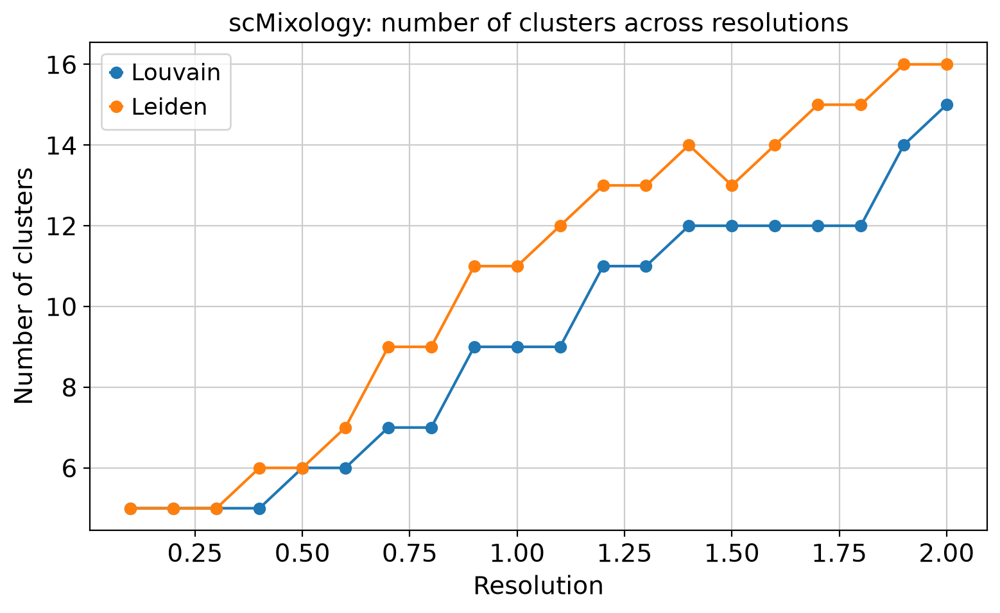

In [19]:
plot_df = clustering_summary.copy()

plt.figure(figsize=(8, 5))
plt.plot(plot_df["resolution"], plot_df["louvain_n_clusters"], marker="o", label="Louvain")
plt.plot(plot_df["resolution"], plot_df["leiden_n_clusters"], marker="o", label="Leiden")
plt.xlabel("Resolution")
plt.ylabel("Number of clusters")
plt.title("scMixology: number of clusters across resolutions")
plt.legend()
plt.tight_layout()
plt.savefig(os.path.join(FIGURE_DIR,f"scMixology_scanpy_{VERSION}_resolution_vs_nclusters.png"), dpi=300)
plt.show()

## pyclustree


Missing Louvain keys: []
Missing Leiden keys: []


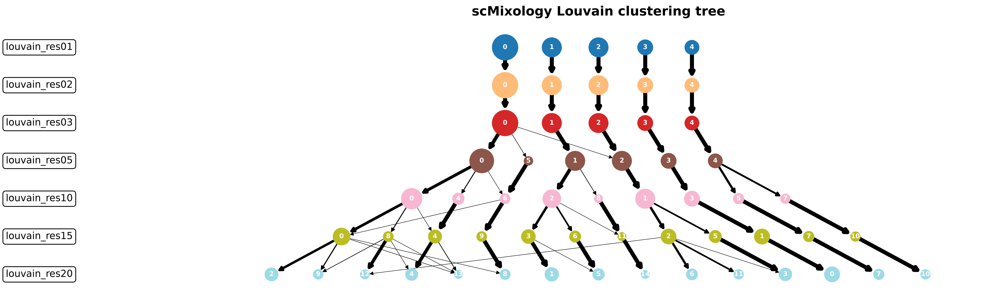

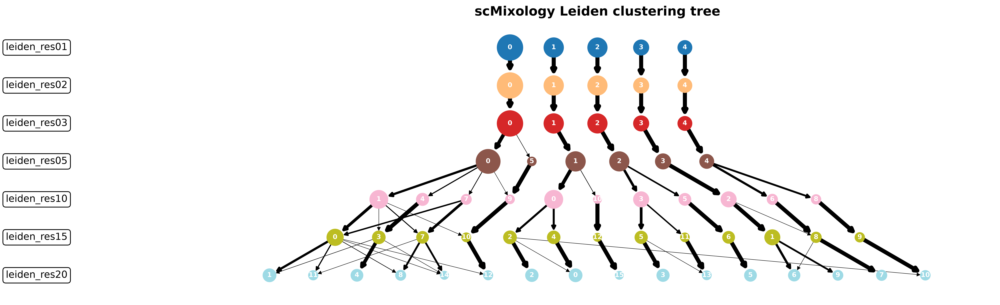

In [20]:
selected_resolutions_for_tree = [0.1, 0.2, 0.3, 0.5, 1.0, 1.5, 2.0]

# Louvain pyclustree
louvain_tree_keys = [
    f"louvain_res{str(r).replace('.', '')}"
    for r in selected_resolutions_for_tree
]

missing_louvain_keys = [key for key in louvain_tree_keys if key not in adata.obs.columns]
print("Missing Louvain keys:", missing_louvain_keys)

if len(missing_louvain_keys) == 0:
    fig_louvain_tree = clustree(
        adata,
        cluster_keys=louvain_tree_keys,
        title="scMixology Louvain clustering tree"
    )

    fig_louvain_tree.savefig(
        os.path.join(FIGURE_DIR, f"scMixology_scanpy_{VERSION}_louvain_pyclustree.png"),
        dpi=300,
        bbox_inches="tight"
    )

# Leiden pyclustree
leiden_tree_keys = [
    f"leiden_res{str(r).replace('.', '')}"
    for r in selected_resolutions_for_tree
]

missing_leiden_keys = [key for key in leiden_tree_keys if key not in adata.obs.columns]
print("Missing Leiden keys:", missing_leiden_keys)

if len(missing_leiden_keys) == 0:
    fig_leiden_tree = clustree(
        adata,
        cluster_keys=leiden_tree_keys,
        title="scMixology Leiden clustering tree"
    )

    fig_leiden_tree.savefig(
        os.path.join(FIGURE_DIR, f"scMixology_scanpy_{VERSION}_leiden_pyclustree.png"),
        dpi=300,
        bbox_inches="tight"
    )


## Final UMAP and t-SNE plots


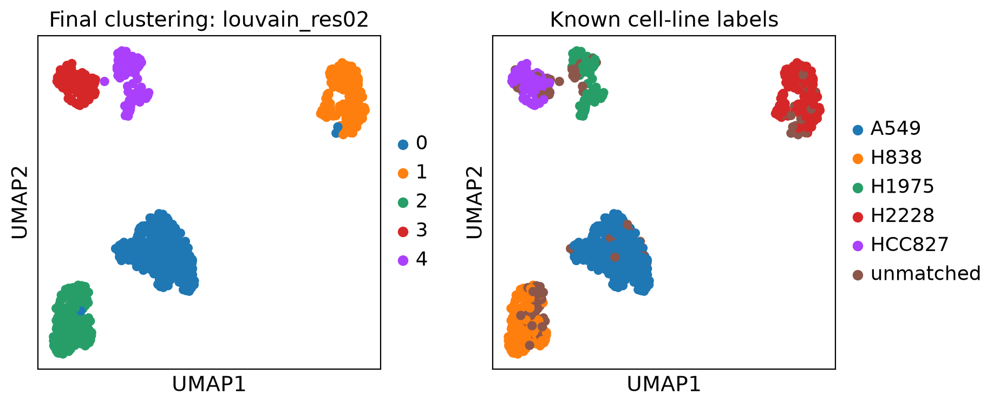

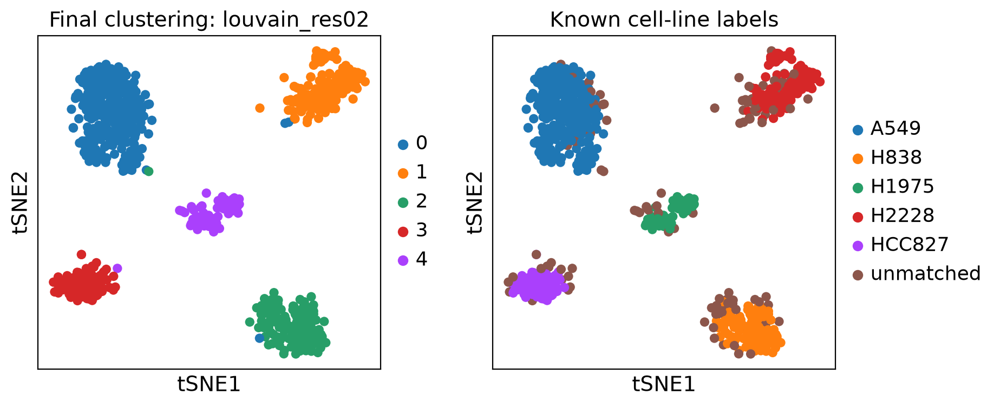

In [21]:
# Final selected clustering vs known cell-line labels

if FINAL_CLUSTER_KEY not in adata.obs.columns:
    raise KeyError(f"{FINAL_CLUSTER_KEY} not found in adata.obs. Check FINAL_SELECTED_RESOLUTION and FINAL_METHOD.")

sc.pl.umap(
    adata,
    color=[FINAL_CLUSTER_KEY, "known_label_plot"],
    legend_loc="right margin",
    ncols=2,
    title=[
        f"Final clustering: {FINAL_CLUSTER_KEY}",
        "Known cell-line labels"
    ],
    save=f"_scMixology_scanpy_{VERSION}_UMAP_final_clustering_vs_known_labels.png"
)

sc.pl.tsne(
    adata,
    color=[FINAL_CLUSTER_KEY, "known_label_plot"],
    legend_loc="right margin",
    ncols=2,
    title=[
        f"Final clustering: {FINAL_CLUSTER_KEY}",
        "Known cell-line labels"
    ],
    save=f"_scMixology_scanpy_{VERSION}_tSNE_final_clustering_vs_known_labels.png"
)


## ARI


In [22]:
# Treat these values as missing/unlabelled
invalid_labels = {
    "",
    "<na>",
    "nan",
    "na",
    "none",
    "unknown",
    "unmatched"
}

# Convert labels to clean strings.
# fillna("") avoids the "boolean value of NA is ambiguous" error.
known_labels = (
    adata.obs["known_label"]
    .astype("string")
    .fillna("")
    .str.strip()
)

results = []

cluster_methods = {
    "Louvain": f"louvain_res{str(FINAL_SELECTED_RESOLUTION).replace('.', '')}",
    "Leiden": f"leiden_res{str(FINAL_SELECTED_RESOLUTION).replace('.', '')}",
}

for method, cluster_key in cluster_methods.items():

    clusters = (
        adata.obs[cluster_key]
        .astype("string")
        .fillna("")
        .str.strip()
    )

    # Keep only cells with:
    # 1. a valid known cell-line label
    # 2. a valid clustering assignment
    labelled = (
        ~known_labels.str.lower().isin(invalid_labels)
        & known_labels.ne("")
        & clusters.ne("")
    )

    true_labels = known_labels.loc[labelled]
    predicted_clusters = clusters.loc[labelled]

    if labelled.sum() > 0:
        ari = adjusted_rand_score(
            true_labels,
            predicted_clusters
        )
    else:
        ari = np.nan

    results.append({
        "method": method,
        "resolution": FINAL_SELECTED_RESOLUTION,
        "cluster_key": cluster_key,
        "cells_used": labelled.sum(),
        "n_clusters": predicted_clusters.nunique(),
        "ARI": ari,
    })

ari_table = pd.DataFrame(results)

# save
ari_table.to_csv(
    os.path.join(TABLE_DIR, f"scMixology_scanpy_{VERSION}_ARI_resolution_{FINAL_SELECTED_RESOLUTION}.csv"),
    index=False
)


ari_table

,method,resolution,cluster_key,cells_used,n_clusters,ARI
0,Louvain,0.2,louvain_res02,672,5,1.0
1,Leiden,0.2,leiden_res02,672,5,1.0


## ARI across all resolutions


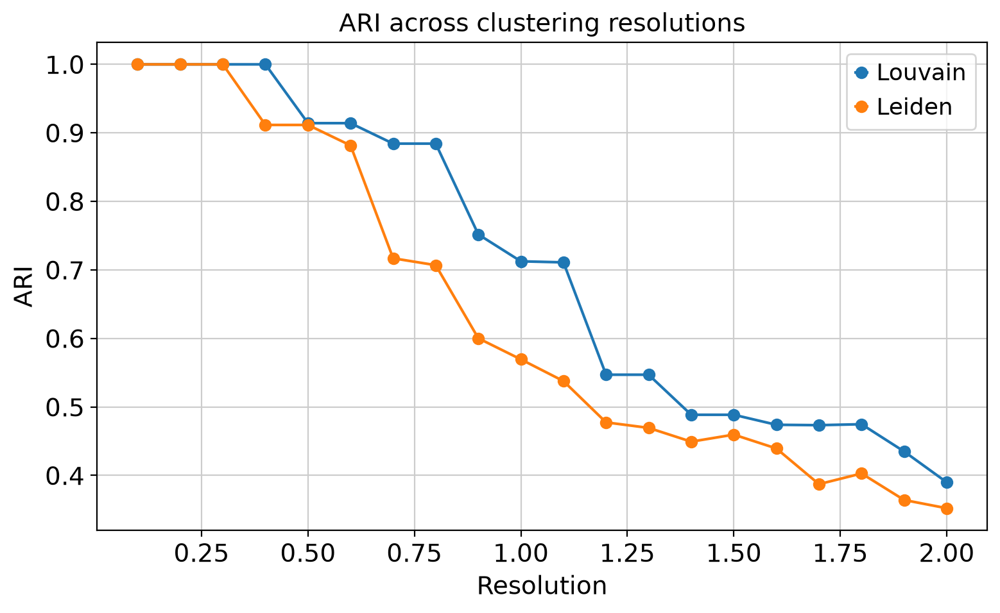

In [23]:
ari_resolution_results = []

known_labels = (
    adata.obs["known_label"]
    .astype("string")
    .fillna("")
    .str.strip()
)

valid_labels = (
    ~known_labels.str.lower().isin(invalid_labels)
    & known_labels.ne("")
)

for res in resolutions:
    res_key = str(res).replace(".", "")

    for method, cluster_key in {
        "Louvain": f"louvain_res{res_key}",
        "Leiden": f"leiden_res{res_key}"
    }.items():

        clusters = (
            adata.obs[cluster_key]
            .astype("string")
            .fillna("")
            .str.strip()
        )

        valid = valid_labels & clusters.ne("")

        if valid.sum() > 0:
            ari = adjusted_rand_score(
                known_labels.loc[valid],
                clusters.loc[valid]
            )
        else:
            ari = np.nan

        ari_resolution_results.append({
            "resolution": res,
            "method": method,
            "cluster_key": cluster_key,
            "n_clusters": clusters.loc[valid].nunique(),
            "cells_used": int(valid.sum()),
            "ARI": ari
        })

ari_resolution_table = pd.DataFrame(ari_resolution_results)

ari_resolution_table.to_csv(
    os.path.join(TABLE_DIR, f"scMixology_scanpy_{VERSION}_ARI_across_resolutions.csv"),
    index=False
)

ari_resolution_table.head()

#plot
plt.figure(figsize=(8, 5))

for method in ari_resolution_table["method"].unique():
    sub = ari_resolution_table[ari_resolution_table["method"] == method]

    plt.plot(
        sub["resolution"],
        sub["ARI"],
        marker="o",
        label=method
    )

plt.xlabel("Resolution")
plt.ylabel("ARI")
plt.title("ARI across clustering resolutions")
plt.legend()
plt.tight_layout()

plt.savefig(
    os.path.join(FIGURE_DIR, f"scMixology_scanpy_{VERSION}_ARI_across_resolutions.png"),
    dpi=300
)

plt.show()

## Find Marker Genes


In [24]:
cluster_key = FINAL_CLUSTER_KEY

if cluster_key not in adata.obs.columns:
    raise KeyError(f"{cluster_key} not found in adata.obs")

if adata.raw is None:
    raise ValueError(
        "adata.raw is missing. Set adata.raw = adata.copy() after normalization/log1p "
        "and before HVG subsetting."
    )

marker_key = f"rank_genes_{cluster_key}"

sc.tl.rank_genes_groups(
    adata,
    groupby=cluster_key,
    method="wilcoxon",
    use_raw=True,
    key_added=marker_key
)

markers = sc.get.rank_genes_groups_df(
    adata,
    group=None,
    key=marker_key
)

markers.to_csv(
    os.path.join(TABLE_DIR, f"scMixology_scanpy_{VERSION}_{cluster_key}_all_markers.csv"),
    index=False
)

markers_filtered = markers[
    (markers["logfoldchanges"] > 0.25) &
    (markers["pvals_adj"] < 0.01)
].copy()

markers_filtered.to_csv(
    os.path.join(TABLE_DIR, f"scMixology_scanpy_{VERSION}_{cluster_key}_filtered_positive_markers.csv"),
    index=False
)

print("All markers:", markers.shape)
print("Filtered positive markers:", markers_filtered.shape)

markers_filtered.head()


ranking genes
    finished: added to `.uns['rank_genes_louvain_res02']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)
All markers: (131420, 6)
Filtered positive markers: (5908, 6)


,group,names,scores,logfoldchanges,pvals,pvals_adj
0,0,AKR1B10,22.707491,6.636755,3.778016e-114,5.014354e-110
1,0,KRT81,22.689899,6.759773,5.636738e-114,5.014354e-110
2,0,ALDH1A1,22.689228,6.800316,5.723277e-114,5.014354e-110
3,0,RPS16,22.630587,1.484799,2.167067e-113,1.423980e-109
4,0,AKR1C2,22.509781,5.382749,3.329069e-112,1.750025e-108


## Select Top 15 and Plot as Heatmap


Number of top marker genes: 75
['AKR1B10', 'KRT81', 'ALDH1A1', 'RPS16', 'AKR1C2', 'AKR1C3', 'AKR1C1', 'GPX2', 'PDE4D', 'S100A4', 'RPS19', 'AGR2', 'G6PD', 'CPLX2', 'CYP24A1', 'SAA1', 'CXCL1', 'CD74', 'LCN2', 'HLA-B', 'TPT1', 'RPS15A', 'B2M', 'CLDN11', 'CXCL6', 'HLA-C', 'BIRC3', 'CPD', 'IGFBP3', 'CXCL8', 'RPS21', 'CFL1', 'C19orf53', 'ATP5F1E', 'MYL9', 'GNG5', 'UBL5', 'CTAG2', 'RPSA', 'SH3BGRL3', 'TTTY14', 'GSTM3', 'TMA7', 'HSPE1', 'ROMO1', 'VOPP1', 'CDKN2A', 'CDK4', 'OS9', 'SEC61G', 'RPL7', 'CHCHD2', 'RPS8', 'RPL5', 'PIP4K2C', 'TBK1', 'RPL36A', 'EGFR', 'ELOC', 'RPS4X', 'LGALS1', 'RPS15', 'MT1E', 'DHRS2', 'RPL28', 'RPL36', 'UQCR10', 'RPS5', 'NDUFA13', 'PRDX2', 'TOMM7', 'MT2A', 'HSPB1', 'ACTB', 'UQCR11']


/tmp/ipykernel_36470/4031492063.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby("group")


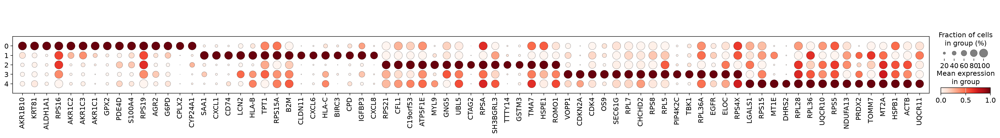

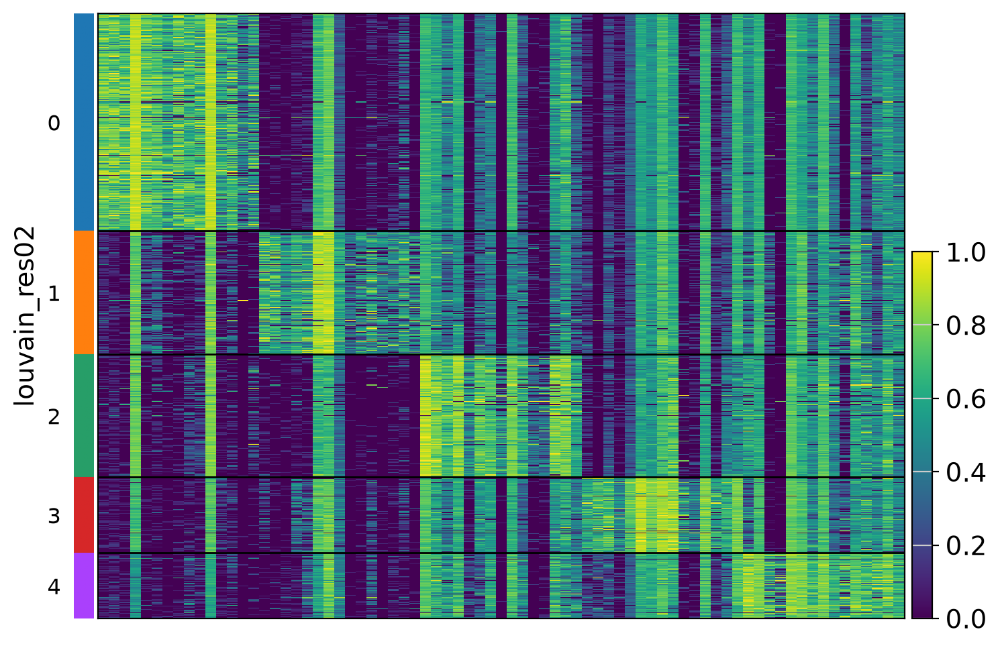

In [25]:
top15_markers = (
    markers_filtered
    .sort_values(["group", "scores"], ascending=[True, False])
    .groupby("group")
    .head(15)
    .copy()
)

top15_markers.to_csv(
    os.path.join(TABLE_DIR,f"scMixology_scanpy_{VERSION}_{cluster_key}_top15_markers.csv"),
    index=False
)

top15_markers.head()

top15_genes = top15_markers["names"].unique().tolist()

print("Number of top marker genes:", len(top15_genes))
print(top15_genes)


# Dotplot
sc.pl.dotplot(
    adata,
    var_names=top15_genes,
    groupby=cluster_key,
    use_raw=True,
    standard_scale="var",
    save=f"_scMixology_scanpy_{VERSION}_{cluster_key}_top15_markers_dotplot.png"
)


# Heatmap
sc.pl.heatmap(
    adata,
    var_names=top15_genes,
    groupby=cluster_key,
    use_raw=True,
    cmap="viridis",
    standard_scale="var",
    save=f"_scMixology_scanpy_{VERSION}_{cluster_key}_top15_markers_heatmap.png"
)

## Select and Plot top 5


/tmp/ipykernel_36470/2753650170.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby("group")


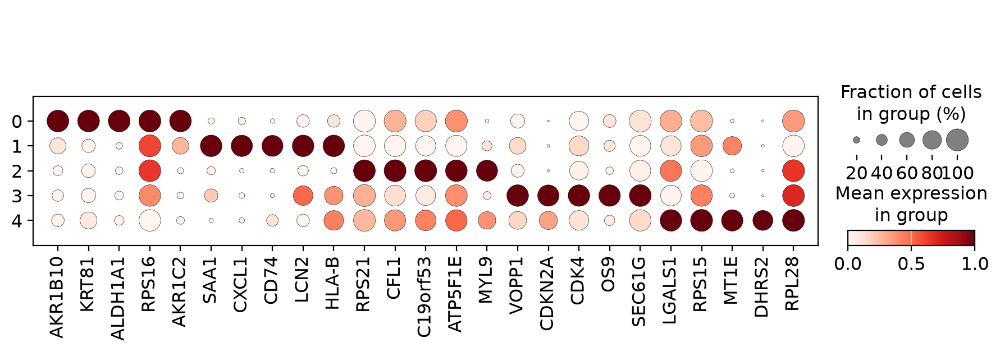

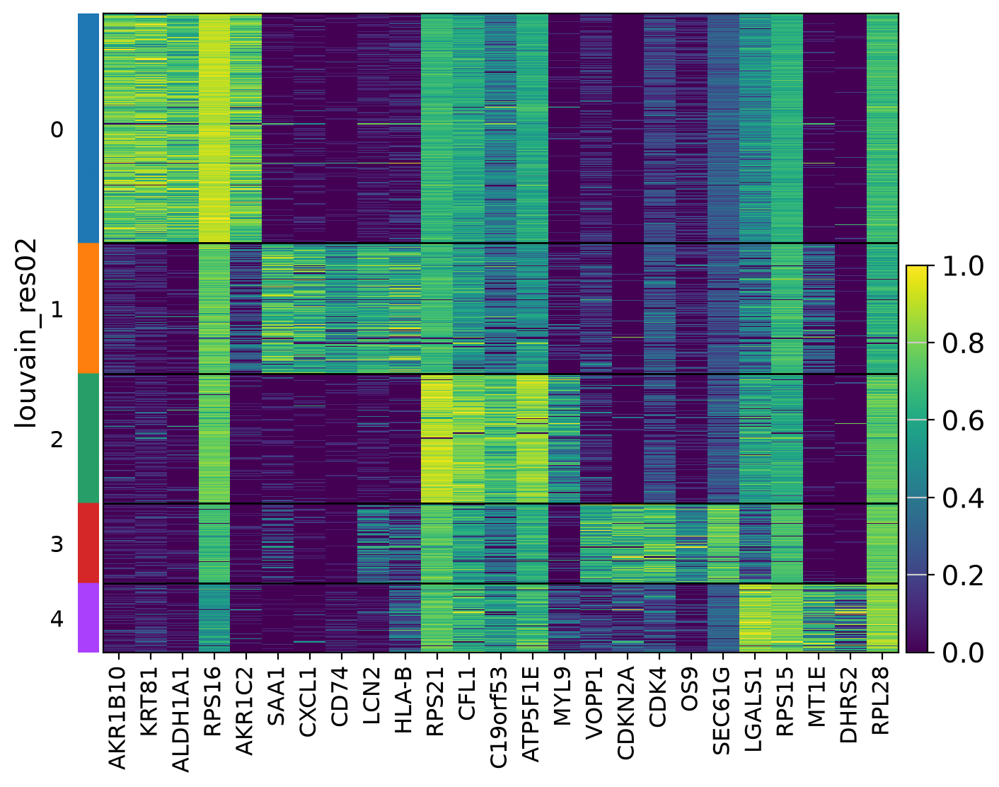

In [26]:
top5_markers = (
    markers_filtered
    .sort_values(["group", "scores"], ascending=[True, False])
    .groupby("group")
    .head(5)
)

top5_genes = top5_markers["names"].unique().tolist()

top5_markers.to_csv(
    os.path.join(TABLE_DIR, f"scMixology_scanpy_{VERSION}_{cluster_key}_top5_markers.csv"),
    index=False
)

# dotplot
sc.pl.dotplot(
    adata,
    var_names=top5_genes,
    groupby=cluster_key,
    use_raw=True,
    standard_scale="var",
    save=f"_scMixology_scanpy_{VERSION}_{cluster_key}_top5_markers_dotplot.png"
)

# heatmap
sc.pl.heatmap(
    adata,
    var_names=top5_genes,
    groupby=cluster_key,
    use_raw=True,
    cmap="viridis",
    standard_scale="var",
    save=f"_scMixology_scanpy_{VERSION}_{cluster_key}_top5_markers_heatmap.png"
)

## Feature plot for top 15 markers from each cluster


Cluster 0:
['AKR1B10', 'KRT81', 'ALDH1A1', 'RPS16', 'AKR1C2', 'AKR1C3', 'AKR1C1', 'GPX2', 'PDE4D', 'S100A4', 'RPS19', 'AGR2', 'G6PD', 'CPLX2', 'CYP24A1']


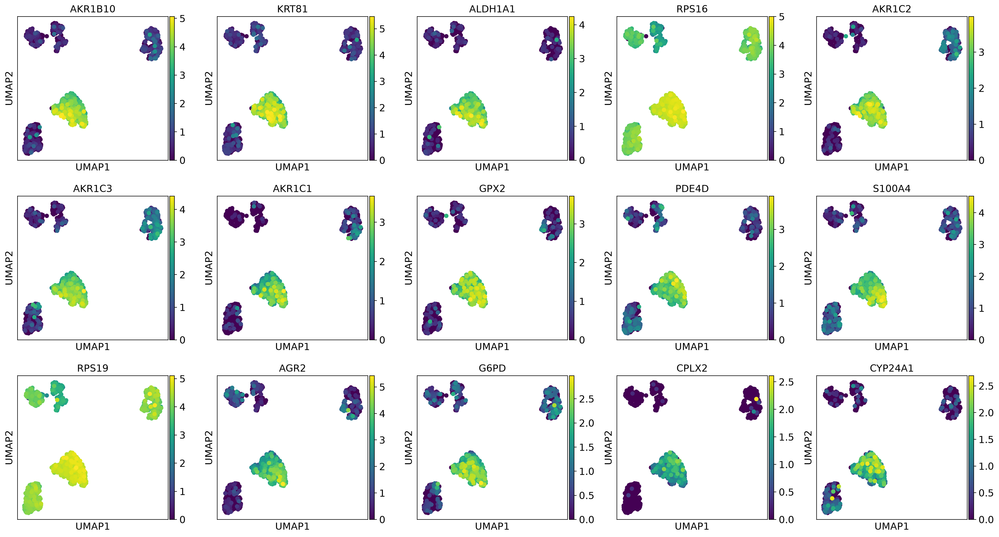

Cluster 1:
['SAA1', 'CXCL1', 'CD74', 'LCN2', 'HLA-B', 'TPT1', 'RPS15A', 'B2M', 'CLDN11', 'CXCL6', 'HLA-C', 'BIRC3', 'CPD', 'IGFBP3', 'CXCL8']


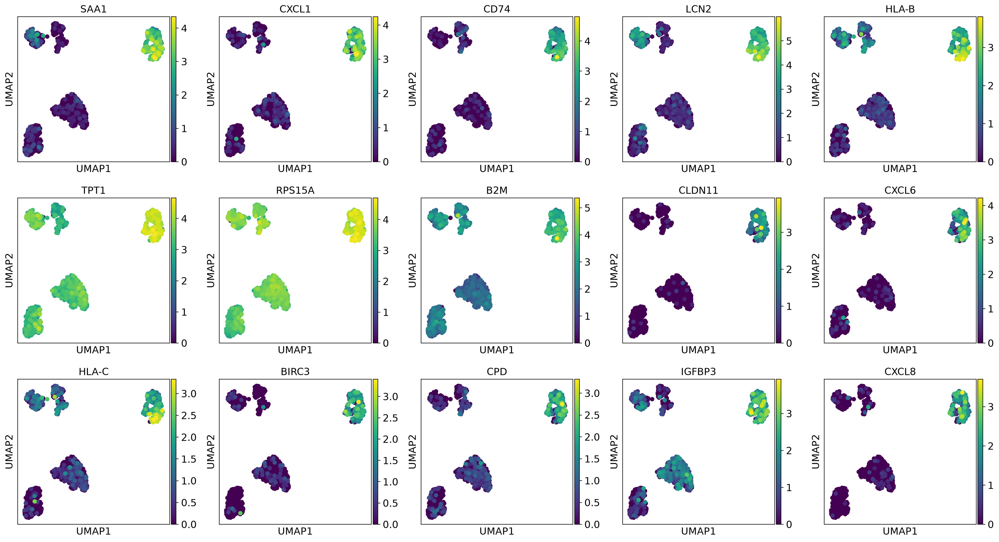

Cluster 2:
['RPS21', 'CFL1', 'C19orf53', 'ATP5F1E', 'MYL9', 'GNG5', 'UBL5', 'CTAG2', 'RPSA', 'SH3BGRL3', 'TTTY14', 'GSTM3', 'TMA7', 'HSPE1', 'ROMO1']


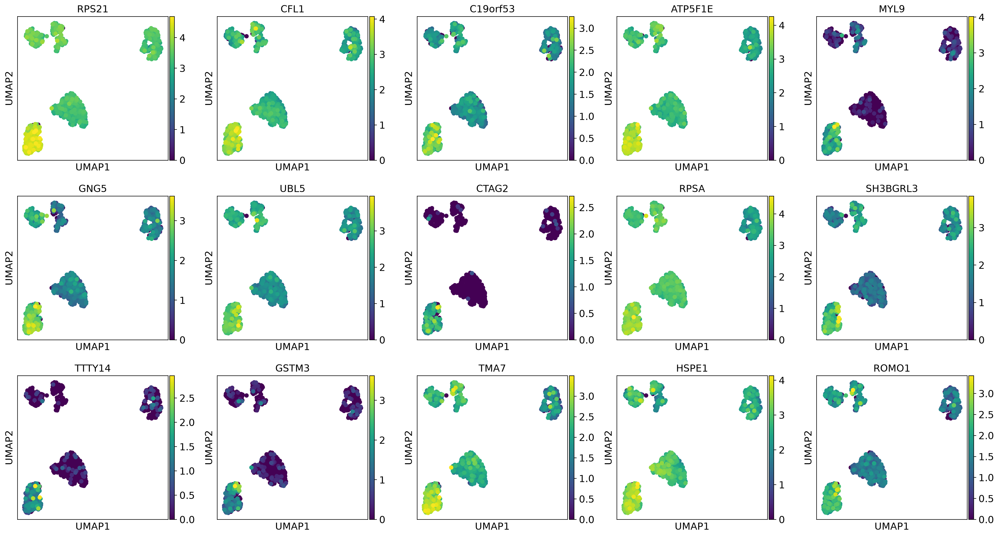

Cluster 3:
['VOPP1', 'CDKN2A', 'CDK4', 'OS9', 'SEC61G', 'RPL7', 'CHCHD2', 'RPS8', 'RPL5', 'PIP4K2C', 'TBK1', 'RPL36A', 'EGFR', 'ELOC', 'RPS4X']


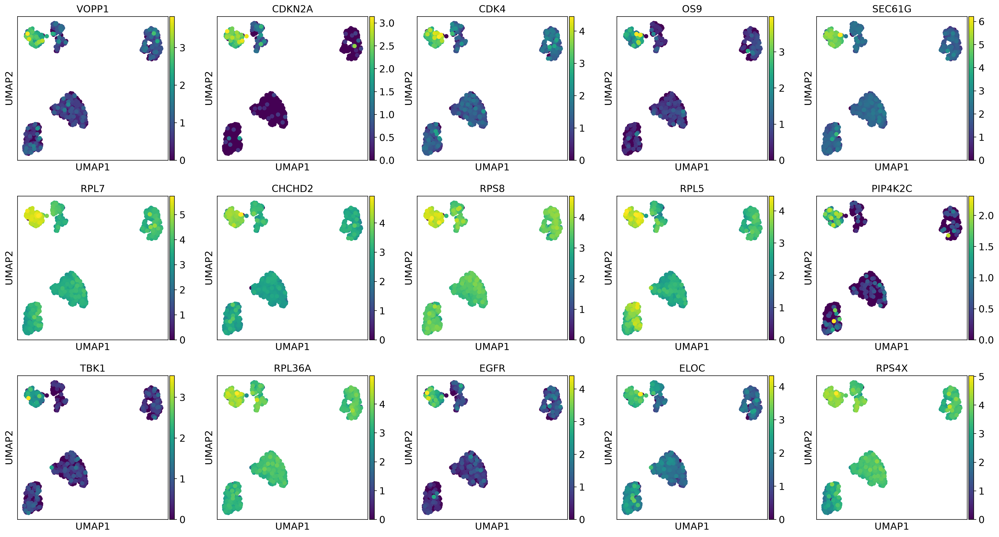

Cluster 4:
['LGALS1', 'RPS15', 'MT1E', 'DHRS2', 'RPL28', 'RPL36', 'UQCR10', 'RPS5', 'NDUFA13', 'PRDX2', 'TOMM7', 'MT2A', 'HSPB1', 'ACTB', 'UQCR11']


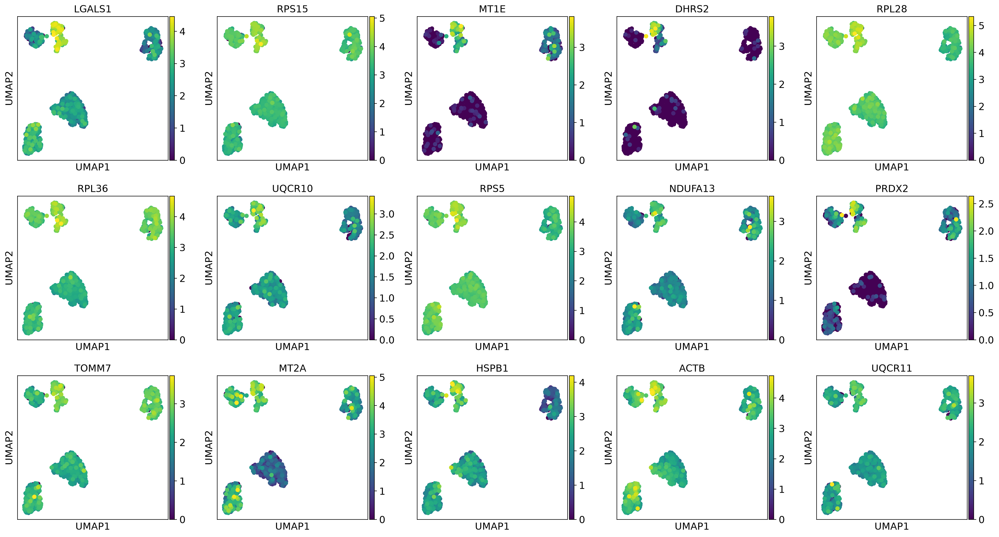

/tmp/ipykernel_36470/315524259.py:29: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby("group")


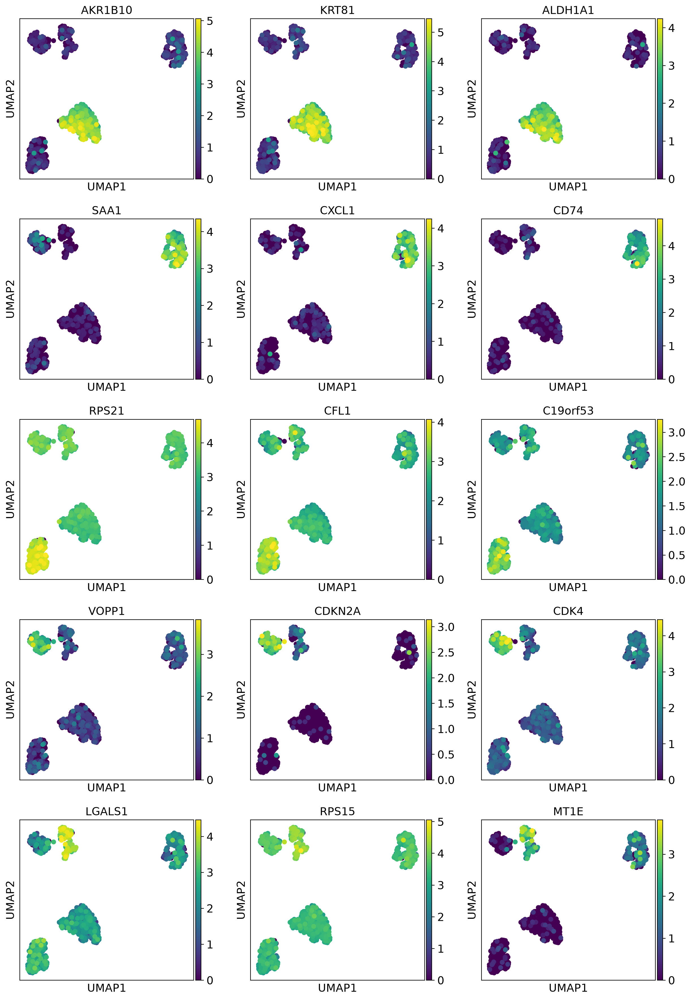

In [27]:

for cluster in top15_markers["group"].unique():

    cluster_marker_genes = (
        top15_markers[top15_markers["group"] == cluster]["names"]
        .unique()
        .tolist()
    )

    print(f"Cluster {cluster}:")
    print(cluster_marker_genes)

    sc.pl.umap(
        adata,
        color=cluster_marker_genes,
        use_raw=True,
        ncols=5,
        cmap="viridis",
        save=f"_scMixology_scanpy_{VERSION}_{cluster_key}_cluster_{cluster}_top15_marker_featureplots_UMAP.png"
    )
    
    
    

# Top 3 markers per cluster for clearer feature plots

top3_markers = (
    markers_filtered
    .sort_values(["group", "scores"], ascending=[True, False])
    .groupby("group")
    .head(3)
    .copy()
)

top3_genes = top3_markers["names"].unique().tolist()

sc.pl.umap(
    adata,
    color=top3_genes,
    use_raw=True,
    ncols=3,
    cmap="viridis",
    save=f"_scMixology_scanpy_{VERSION}_{cluster_key}_top3_markers_featureplots_UMAP.png"
)

## Save Processed Object


In [28]:
adata_to_save = adata.copy()

for col in adata_to_save.obs.columns:
    if adata_to_save.obs[col].dtype.name in ["object", "string", "category"]:
        adata_to_save.obs[col] = (
            adata_to_save.obs[col]
            .astype("object")
            .where(adata_to_save.obs[col].notna(), "unmatched")
            .astype(str)
        )

processed_file = os.path.join(
    OBJECT_DIR,
    f"scMixology_scanpy_{VERSION}_processed.h5ad"
)

adata_to_save.write_h5ad(processed_file)

print("Saved processed object:")
print(processed_file)


Saved processed object:
/home/mtarzi/CEPH/scRNA_sequencing_scMixology_benchmarking/scanpy_outputs/objects/scMixology_scanpy_V8_processed.h5ad


## Runtime and session info


In [29]:
# Run time
total_runtime_seconds = time.time() - workflow_start

total_runtime = pd.DataFrame([{
    "dataset": DATASET,
    "version": VERSION,
    "total_runtime_seconds": total_runtime_seconds,
    "total_runtime_minutes": total_runtime_seconds / 60,
}])

total_runtime.to_csv(
    os.path.join(TABLE_DIR, f"{DATASET}_{VERSION}_total_runtime.csv"),
    index=False,
)
print(f"total_runtime_minutes: {total_runtime_seconds/60}")


# Session info
session_info = pd.DataFrame([{
    "python_version": platform.python_version(),
    "platform": platform.platform(),
    "scanpy_version": sc.__version__,
    "numpy_version": np.__version__,
    "pandas_version": pd.__version__,
    "anndata_version": ad.__version__,
    "sklearn_version": sklearn.__version__
}])

session_info.to_csv(
    os.path.join(TABLE_DIR, f"scMixology_scanpy_{VERSION}_session_info.csv"),
    index=False
)
session_info

total_runtime_minutes: 1.039498786131541


/tmp/ipykernel_36470/1458612690.py:22: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('scanpy')` instead
  "scanpy_version": sc.__version__,
/tmp/ipykernel_36470/1458612690.py:25: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  "anndata_version": ad.__version__,


,python_version,platform,scanpy_version,numpy_version,pandas_version,anndata_version,sklearn_version
0,3.11.15,Linux-5.13.2-051302-generic-x86_64-with-glibc2.29,1.11.5,2.4.6,2.3.3,0.12.19,1.9.0
